In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import numpy as np
import cv2
import random
import time
import os

In [2]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [3]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

C:\Users\ian\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ian\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
model


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [5]:
def random_colour_masks(image):
    colours = [[0, 255, 0], [0, 0, 255], [255, 0, 0], [0, 255, 255],
              [255, 255, 0], [255, 0, 255], [80, 70, 180], [250, 80, 190],
              [245, 145, 50], [70, 150, 250], [50, 190, 190]]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    
    r[image == 1], g[image == 1], b[image == 1] = colours[random.randrange(0, 10)]
    coloured_mask = np.stack([r, g, b], axis = 2)
    return coloured_mask

In [51]:
def get_prediction(img_path, threshold):
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
    masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(int(i[0]), int(i[1])), (int(i[2]), int(i[3]))] for i in list(pred[0]['boxes'].detach().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class

In [52]:
def instance_segmentation_api(img_path, threshold=0.5, rect_th=3, 
                              text_size=2, text_th=2):
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
        rgb_mask = random_colour_masks(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        print(boxes[i][0], boxes[i][1])
        cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), \
                      thickness=rect_th)
        cv2.putText(img,pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX,\
                    text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

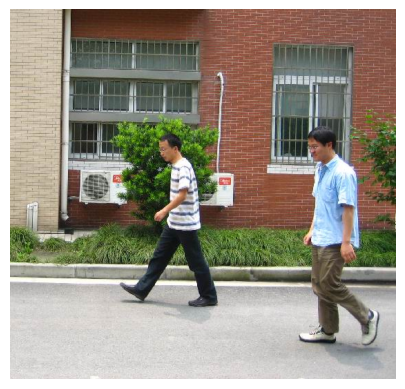

In [46]:
img = Image.open('./FudanPed00001.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [29]:
transform = T.Compose([T.ToTensor()])
img_tensor = transform(img)

model.eval()
pred = model([img_tensor])

pred[0]

{'boxes': tensor([[158.9167, 174.7144, 301.3433, 433.7520],
         [418.4989, 165.8802, 535.9410, 490.1069],
         [242.6754, 223.8777, 269.8047, 257.7699]], grad_fn=<StackBackward0>),
 'labels': tensor([ 1,  1, 27]),
 'scores': tensor([0.9998, 0.9996, 0.1162], grad_fn=<IndexBackward0>),
 'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]],
 
 
         [[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]],
 
 
         [[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
        

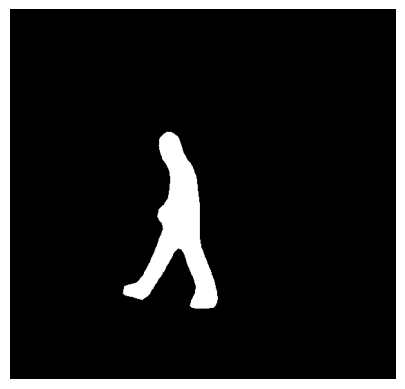

In [30]:
# 保留遮罩值>0.5的像素，其他一律為 0
masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()

# 顯示遮罩
plt.imshow(masks[0], cmap='gray')
plt.axis('off')
plt.show()

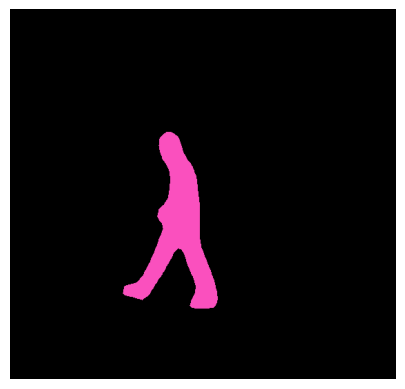

In [31]:
mask1 = random_colour_masks(masks[0])
plt.imshow(mask1)
plt.axis('off')
plt.show()

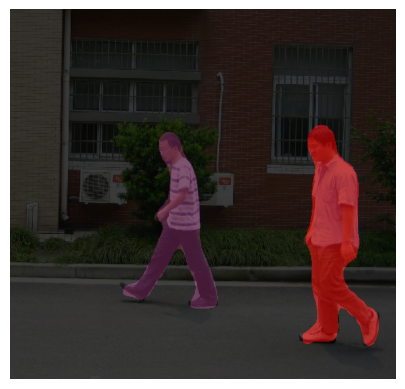

In [32]:
blend_img = cv2.addWeighted(np.asarray(img), 0.5, mask1, 0.5, 0)
mask2 = random_colour_masks(masks[1])
blend_img = cv2.addWeighted(np.asarray(blend_img), 0.5, mask2, 0.5, 0)

plt.imshow(blend_img)
plt.axis('off')
plt.show()

(2, 196) (296, 788)
(528, 215) (822, 800)
(793, 263) (1084, 796)
(240, 221) (517, 792)
(1040, 273) (1377, 791)
(431, 190) (637, 777)
(800, 91) (998, 441)
(1099, 104) (1217, 388)
(994, 199) (1149, 519)
(1175, 168) (1377, 589)
(612, 104) (855, 478)
(375, 131) (492, 361)
(174, 45) (331, 416)
(792, 112) (1053, 610)
(1260, 229) (1376, 594)


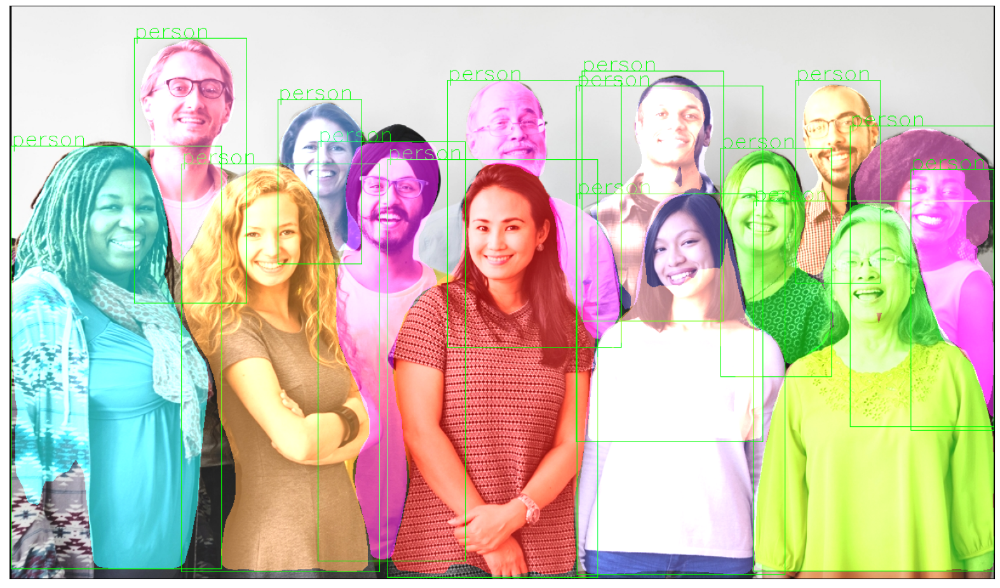

In [53]:
instance_segmentation_api('./Mask_RCNN/people1.jpg', 0.5, rect_th=1, 
                              text_size=1, text_th=1)

(695, 314) (800, 364)
(825, 351) (1032, 449)
(150, 350) (409, 437)
(942, 435) (1340, 625)
(409, 310) (568, 360)
(212, 453) (535, 659)
(926, 307) (1086, 358)
(469, 356) (690, 449)
(589, 446) (878, 711)
(1054, 350) (1328, 438)


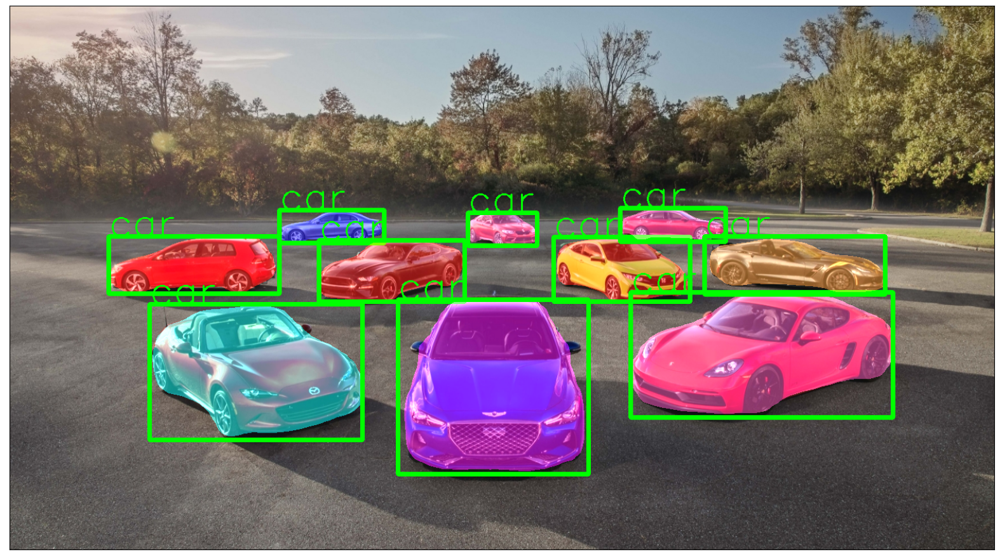

In [54]:
instance_segmentation_api('./Mask_RCNN/car.jpg', 0.9, rect_th=5, text_size=2, text_th=2)


(192, 354) (278, 424)
(11, 455) (162, 565)
(317, 340) (395, 405)
(623, 297) (677, 344)
(638, 384) (729, 464)
(411, 250) (459, 288)
(667, 432) (764, 506)
(142, 497) (286, 635)
(694, 561) (821, 637)
(638, 344) (708, 396)
(226, 536) (257, 562)
(452, 217) (482, 243)
(738, 199) (776, 210)
(682, 500) (790, 594)
(495, 394) (602, 534)
(809, 204) (852, 218)
(366, 236) (399, 265)
(528, 260) (577, 306)
(514, 289) (574, 347)
(508, 355) (570, 399)
(469, 200) (488, 220)
(484, 192) (503, 211)
(605, 248) (663, 316)
(528, 236) (566, 262)
(196, 186) (207, 214)
(598, 198) (669, 286)
(516, 333) (574, 371)
(404, 201) (454, 239)
(532, 253) (570, 269)
(568, 184) (582, 200)
(529, 266) (575, 289)
(537, 188) (562, 213)
(479, 514) (626, 635)
(531, 233) (564, 247)
(498, 511) (608, 578)
(536, 208) (565, 238)


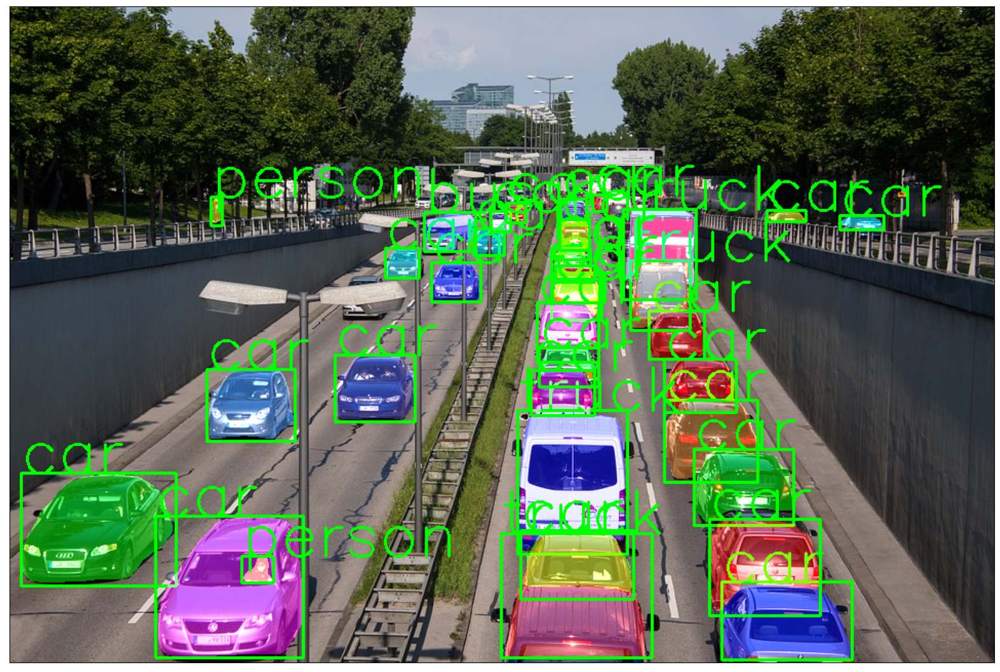

In [55]:
instance_segmentation_api('./Mask_RCNN/traffic.jpg', 0.6, rect_th=2, text_size=2, text_th=2)


(176, 125) (326, 400)
(427, 130) (583, 402)
(290, 170) (446, 409)


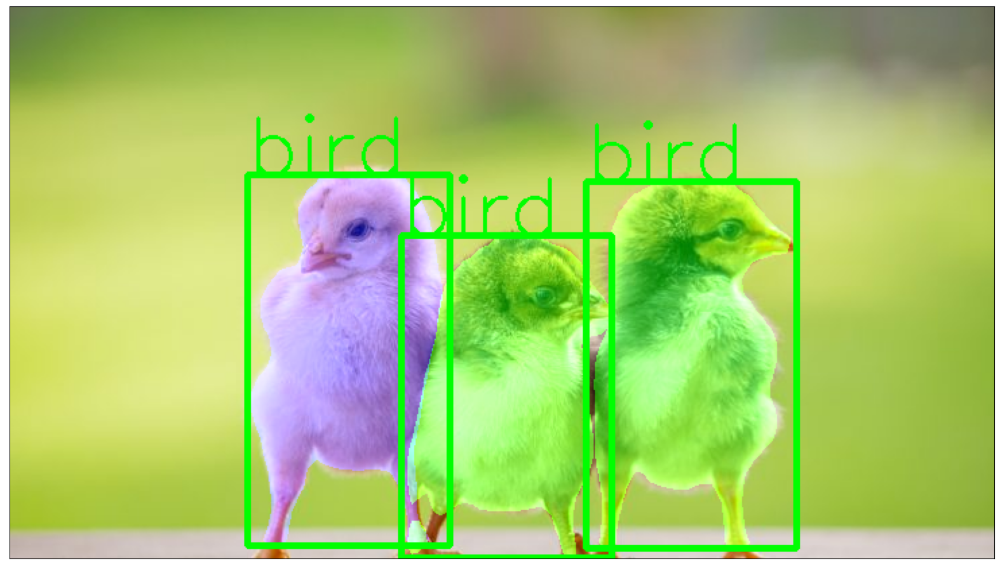

In [56]:
instance_segmentation_api('./Mask_RCNN/birds.jpg', 0.9)  


(287, 195) (351, 319)
(398, 208) (452, 319)
(1, 88) (246, 314)
(374, 212) (398, 270)
(344, 209) (362, 269)
(203, 209) (265, 316)
(466, 215) (493, 270)
(362, 212) (381, 266)
(189, 202) (201, 234)
(371, 168) (389, 188)
(464, 212) (473, 242)
(443, 212) (457, 248)
(197, 209) (222, 240)
(228, 211) (262, 278)
(396, 242) (426, 284)
(486, 213) (500, 271)


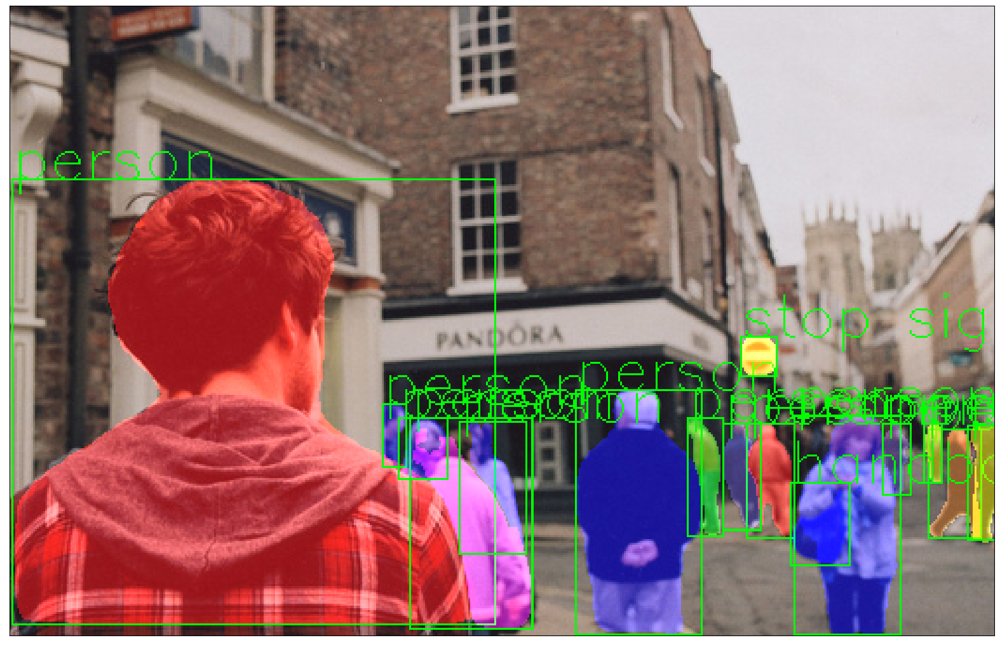

In [57]:
instance_segmentation_api('./Mask_RCNN/people2.jpg', 0.8, 
                          rect_th=1, text_size=1, text_th=1)    

(1711, 590) (3500, 4020)
(643, 1691) (1983, 3993)


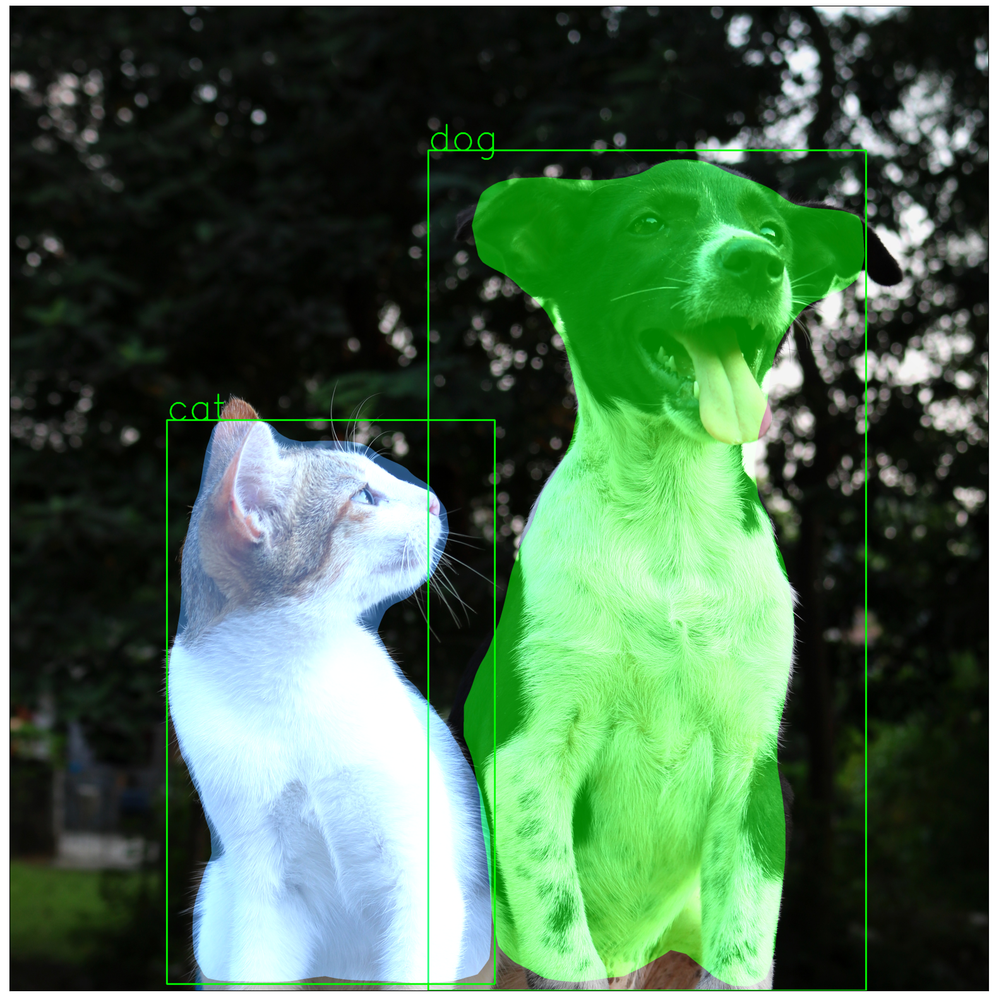

In [58]:
instance_segmentation_api('./Mask_RCNN/cat_dog.jpg', 0.95, rect_th=5, text_size=5, text_th=5)    


In [59]:
def pick_person_mask(img_path, threshold = 0.5, rect_th = 3, text_size = 3, text_th = 3):
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    
    person_ids = [i for i in range(len(pred_cls)) if pred_cls[i] == 'person']
    
    person_masks = masks[person_ids, :, :]
    persons_mask = person_masks.sum(axis=0)
    persons_mask = np.clip(persons_mask, 0,1)
    return persons_mask 

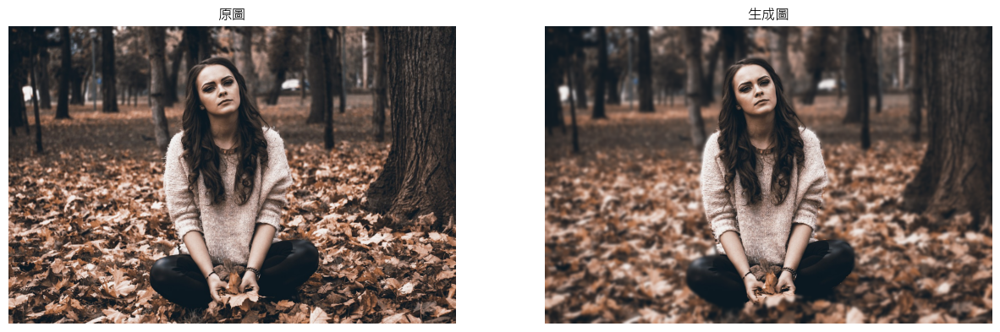

In [66]:
img_path = "./Mask_RCNN/blur.jpg"
img = cv2.imread(img_path)

person_mask = pick_person_mask(img_path, threshold=0.5, rect_th=3
                               , text_size=3, text_th=3).astype(np.uint8)
person_mask = np.repeat(person_mask[:, :, None], 3, axis=2)

# 照片模糊化
img_blur = cv2.GaussianBlur(img, (21, 21), 0)
final_img = np.where(person_mask==1, img, img_blur)

# fix 中文亂碼 
from matplotlib.font_manager import FontProperties
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei'] # 微軟正黑體
plt.rcParams['axes.unicode_minus'] = False
# 顯示原圖與生成圖，比較背景的處理效果
plt.figure(figsize=(15,15))
plt.subplot(121)
plt.title('原圖')
plt.imshow(img[:,:,::-1])
plt.axis('off')
plt.subplot(122)
plt.title('生成圖')
plt.imshow(final_img[:,:,::-1])
plt.axis('off')
plt.show()

In [67]:
final_img

array([[[ 34,  26,  15],
        [ 34,  26,  15],
        [ 34,  26,  15],
        ...,
        [ 35,  27,  19],
        [ 35,  27,  19],
        [ 34,  27,  19]],

       [[ 34,  26,  15],
        [ 34,  26,  15],
        [ 34,  26,  15],
        ...,
        [ 35,  27,  19],
        [ 35,  27,  19],
        [ 35,  27,  19]],

       [[ 34,  26,  15],
        [ 34,  26,  15],
        [ 34,  26,  15],
        ...,
        [ 35,  28,  20],
        [ 35,  27,  19],
        [ 35,  27,  19]],

       ...,

       [[ 85, 106, 152],
        [ 85, 107, 152],
        [ 86, 108, 154],
        ...,
        [ 70,  86, 115],
        [ 69,  86, 113],
        [ 68,  85, 113]],

       [[ 85, 107, 153],
        [ 86, 107, 153],
        [ 87, 108, 155],
        ...,
        [ 70,  88, 117],
        [ 69,  87, 115],
        [ 69,  86, 115]],

       [[ 85, 107, 153],
        [ 86, 108, 154],
        [ 87, 109, 155],
        ...,
        [ 71,  88, 117],
        [ 70,  87, 116],
        [ 69,  87, 115]]